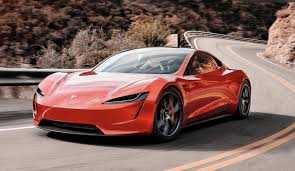

## Machine Learning 

### Cross Validation 

In this project, we'll cover:

* Chain multiple data processing steps together using `Pipeline`
* Use the `KFolds` object to split data into multiple folds.

### Load python librarie

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/used-car-dataset-ford-and-mercedes/cclass.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/unclean cclass.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/focus.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/audi.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/toyota.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/skoda.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/ford.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/vauxhall.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/bmw.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/vw.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/hyundi.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/unclean focus.csv
/kaggle/input/used-car-dataset-ford-and-mercedes/merc.csv


In [2]:
# Surpress warnings:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

from scipy import stats
from scipy.stats import boxcox
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline

**Set a directory**

In [3]:
def  plot_dis(y,yhat):
    
    plt.figure()
    ax1 = sns.distplot(y, hist=False, color="r", label="Actual Value")
    sns.distplot(yhat, hist=False, color="b", label="Fitted Values" , ax=ax1)
    plt.legend()

    plt.title('Actual vs Fitted Values')
    plt.xlabel('Price (in dollars)')
    plt.ylabel('Proportion of Cars')

    plt.show()
    plt.close()

In [4]:
os.listdir()

['__notebook__.ipynb']

In [5]:
data = os.listdir("/kaggle/input/used-car-dataset-ford-and-mercedes/")

In [6]:

for d in data:
    path="/kaggle/input/used-car-dataset-ford-and-mercedes/"+d
    df=pd.read_csv(path)
    print(df.columns)


Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType',
       'engineSize'],
      dtype='object')
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuel type',
       'engine size', 'mileage2', 'fuel type2', 'engine size2', 'reference'],
      dtype='object')
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType',
       'engineSize'],
      dtype='object')
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize'],
      dtype='object')
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize'],
      dtype='object')
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize'],
      dtype='object')
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize'],
      dtype='object')
Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'ta

In [7]:
import pandas as pd
import os

car_list = []  # List to hold DataFrames

for d in data:
    path = os.path.join("/kaggle/input/used-car-dataset-ford-and-mercedes/", d)
    if "unclean" not in d:
        try:
            df = pd.read_csv(path)
            df['brand'] = d.replace(".csv", "")
            car_list.append(df)  # Append DataFrame to the list
        except Exception as e:
            print(f"Error reading {d}: {e}")

# Concatenate all DataFrames in the list into a single DataFrame
car = pd.concat(car_list, ignore_index=True)

In [8]:
car.head()

,model,year,price,transmission,mileage,fuelType,engineSize,brand,tax,mpg,tax(£)
0,C Class,2020,30495,Automatic,1200,Diesel,2.0,cclass,NaN,NaN,NaN
1,C Class,2020,29989,Automatic,1000,Petrol,1.5,cclass,NaN,NaN,NaN
2,C Class,2020,37899,Automatic,500,Diesel,2.0,cclass,NaN,NaN,NaN
3,C Class,2019,30399,Automatic,5000,Diesel,2.0,cclass,NaN,NaN,NaN
4,C Class,2019,29899,Automatic,4500,Diesel,2.0,cclass,NaN,NaN,NaN


## **Data Cleaning and Wrangling**

Here, we'll check if there's missing value, duplicates, etc...

Removed duplicated values

In [9]:
car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108540 entries, 0 to 108539
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   model         108540 non-null  object 
 1   year          108540 non-null  int64  
 2   price         108540 non-null  int64  
 3   transmission  108540 non-null  object 
 4   mileage       108540 non-null  int64  
 5   fuelType      108540 non-null  object 
 6   engineSize    108540 non-null  float64
 7   brand         108540 non-null  object 
 8   tax           94327 non-null   float64
 9   mpg           99187 non-null   float64
 10  tax(£)        4860 non-null    float64
dtypes: float64(4), int64(3), object(4)
memory usage: 9.1+ MB


In [10]:
car.isna().sum()

model                0
year                 0
price                0
transmission         0
mileage              0
fuelType             0
engineSize           0
brand                0
tax              14213
mpg               9353
tax(£)          103680
dtype: int64

Delete tax(£) column

In [11]:
car.drop(['tax(£)'], axis=1, inplace=True)

In [12]:
#check for duplicate
car.duplicated().sum()

2281

There are 2281 duplicate values in the dataset to be delete

In [13]:
car.drop_duplicates(inplace=True)

We'll replace the null value in tax and mpg column with mean values

In [14]:
#replace all nan with mean value
car['tax'] = car['tax'].fillna(0)
car['tax'] = car['tax'].replace(0,car['tax'].mean())
car['mpg'] = car['mpg'].fillna(0)
car['mpg'] = car['mpg'].replace(0,car['mpg'].mean())


#balanced the dataframe to equal number of rows
#df = car.iloc[:98916]

#df.dropna(inplace=True)

In [15]:
car.isna().sum()

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
engineSize      0
brand           0
tax             0
mpg             0
dtype: int64

In [16]:
car.info()

<class 'pandas.core.frame.DataFrame'>
Index: 106259 entries, 0 to 108539
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   model         106259 non-null  object 
 1   year          106259 non-null  int64  
 2   price         106259 non-null  int64  
 3   transmission  106259 non-null  object 
 4   mileage       106259 non-null  int64  
 5   fuelType      106259 non-null  object 
 6   engineSize    106259 non-null  float64
 7   brand         106259 non-null  object 
 8   tax           106259 non-null  float64
 9   mpg           106259 non-null  float64
dtypes: float64(3), int64(3), object(4)
memory usage: 8.9+ MB


Well the data has been we structure now we can move on to EDA

In [17]:
car.describe().T

,count,mean,std,min,25%,50%,75%,max
year,106259.0,2017.072417,2.132164,1970.0,2016.000000,2017.0,2019.0,2060.0
price,106259.0,16863.144590,9780.204601,450.0,10190.000000,14579.0,20883.5,159999.0
mileage,106259.0,23220.133937,21127.111496,1.0,7724.000000,17515.0,32449.0,323000.0
engineSize,106259.0,1.664954,0.558172,0.0,1.200000,1.6,2.0,6.6
tax,106259.0,124.254798,52.272027,10.0,105.033974,145.0,145.0,580.0
mpg,106259.0,54.847939,15.564016,0.3,47.100000,53.3,61.4,470.8


### EXPLORATORY DATA ANALYSIS(EDA

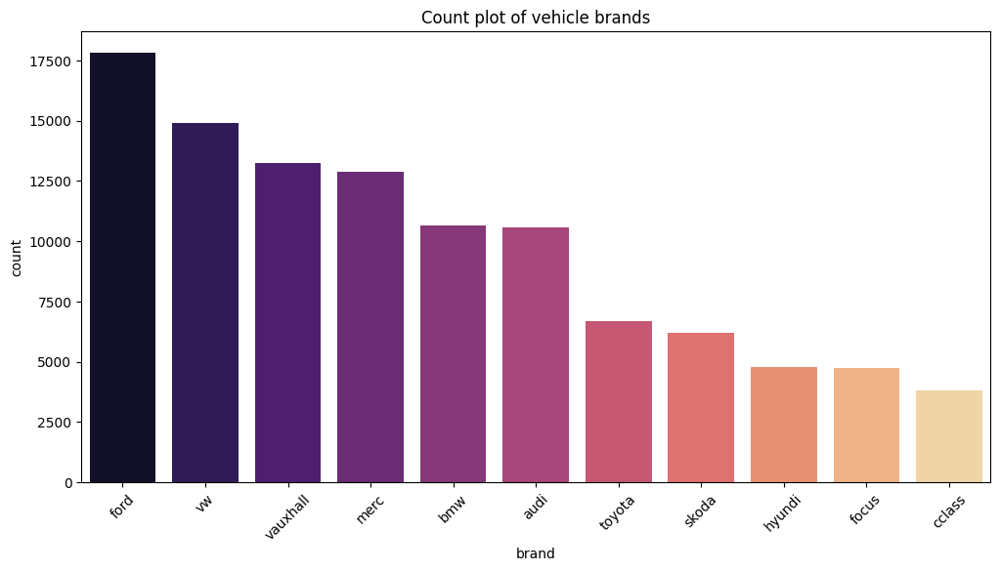

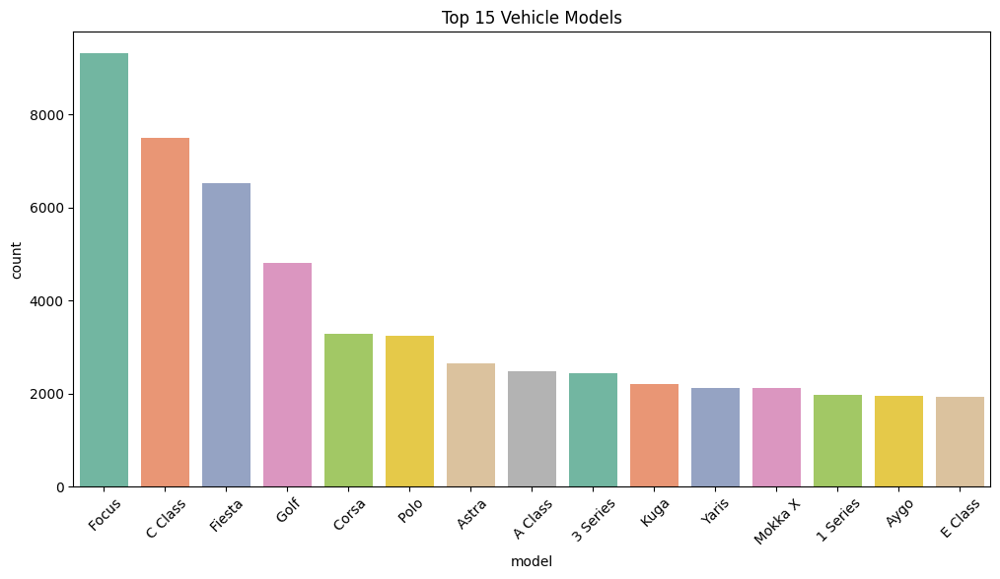

In [18]:
# Assuming 'car' is your DataFrame containing vehicle data
model_df = car['model'].value_counts().reset_index()
model_df.columns = ['model', 'count']  # Rename columns
model_df = model_df.sort_values(by='count', ascending=False).head(15)

brand_df = car['brand'].value_counts().reset_index()
brand_df.columns = ['brand', 'count']  # Rename columns
brand_df = brand_df.sort_values(by='count', ascending=False)

# Visualize the brand counts
plt.figure(figsize=(12, 6))
sns.barplot(data=brand_df, x='brand', y='count', palette="magma")
plt.title('Count plot of vehicle brands')
plt.xticks(rotation=45)  # Rotate x labels for better readability
plt.show()

# Visualize the model counts
plt.figure(figsize=(12, 6))
sns.barplot(data=model_df, x='model', y='count', palette='Set2')
plt.title('Top 15 Vehicle Models')
plt.xticks(rotation=45)  # Rotate x labels for better readability
plt.show()

In [19]:
car[['price','mileage']].describe()

,price,mileage
count,106259.000000,106259.000000
mean,16863.144590,23220.133937
std,9780.204601,21127.111496
min,450.000000,1.000000
25%,10190.000000,7724.000000
50%,14579.000000,17515.000000
75%,20883.500000,32449.000000
max,159999.000000,323000.000000


In [20]:
car = car[car['year'] < 2020]


## Looking for Correlations

Let's check how the data are correlated

In [21]:
df_corr = car.select_dtypes(include = ['float64', 'int64'])
df_num_corr = df_corr.corr()['price'] # -1 means that the latest row is price
top_features = df_num_corr[abs(df_num_corr) > 0.2].sort_values(ascending=False) #displays pearsons correlation coefficient 
print("There is {} strongly correlated values with price:\n{}".format(len(top_features), top_features))

There is 6 strongly correlated values with price:
price         1.000000
engineSize    0.635845
year          0.478231
tax           0.258471
mpg          -0.273209
mileage      -0.413123
Name: price, dtype: float64


In [22]:
#we'll add brand category that fiscribe price  budget, mid range and Luxury vehicle
car['brand_category'] = car['price'].apply(lambda x : "Budget" if x < 10000 
                                                     else ("Mid_Range" if 10000 <= x < 20000
                                                           else "Luxury"))

car.head()

,model,year,price,transmission,mileage,fuelType,engineSize,brand,tax,mpg,brand_category
3,C Class,2019,30399,Automatic,5000,Diesel,2.0,cclass,105.033974,50.76112,Luxury
4,C Class,2019,29899,Automatic,4500,Diesel,2.0,cclass,105.033974,50.76112,Luxury
7,C Class,2019,37990,Automatic,1412,Petrol,3.0,cclass,105.033974,50.76112,Luxury
8,C Class,2019,28990,Automatic,3569,Diesel,2.0,cclass,105.033974,50.76112,Luxury
9,C Class,2019,28990,Automatic,3635,Diesel,2.0,cclass,105.033974,50.76112,Luxury


There are some typos in the names of the cars, so they should be corrected.


In [23]:
#will rename focus with ford
car['brand'] = car['brand'].replace('focus','ford')
#only mercedes cclass there is no car brand name cclass beside mercedes
car['brand'] = car['brand'].replace('cclass','mercedes')
car['brand'] = car['brand'].replace('merc','mercedes')

In [24]:
# Group by brand and transmission, and calculate count, mean, and sum of prices
model = car.groupby(["brand", "transmission"])["price"].agg(['count', 'mean', 'sum']).reset_index()

# Create a DataFrame from the model and apply a background gradient style
model_price = pd.DataFrame(model)
model_price.style.background_gradient(axis=0)


,brand,transmission,count,mean,sum
0,audi,Automatic,2525,27476.049505,69377025
1,audi,Manual,4195,15760.479857,66115213
2,audi,Semi-Auto,3156,25681.054499,81049408
3,bmw,Automatic,3467,22029.597058,76376613
4,bmw,Manual,2422,14247.435178,34507288
5,bmw,Semi-Auto,4053,26043.432519,105554032
6,ford,Automatic,1759,15472.478113,27216089
7,ford,Manual,19285,11953.518227,230523599
8,ford,Semi-Auto,1217,14305.904684,17410286
9,hyundi,Automatic,634,15997.722397,10142556


Average price on the brand categories

In [25]:
brands = car.groupby('brand_category')[['price','tax']].mean().reset_index()
brands

,brand_category,price,tax
0,Budget,7787.839128,105.996365
1,Luxury,28718.772358,146.644488
2,Mid_Range,14565.239316,120.875206


In [26]:
# Group by brand and transmission, and calculate count, mean, and sum of tax
brand_tax = car.groupby(["brand_category", "transmission"])["tax"].agg(['count', 'mean', 'sum']).reset_index()

# Create a DataFrame from the model and apply a background gradient style
brand_tax = pd.DataFrame(brand_tax)
brand_tax.style.background_gradient(axis=0)
 


,brand_category,transmission,count,mean,sum
0,Budget,Automatic,1800,154.539521,278171.137457
1,Budget,Manual,23244,101.957138,2369891.723430
2,Budget,Semi-Auto,784,114.300065,89611.251141
3,Luxury,Automatic,9249,148.641080,1374781.351744
4,Luxury,Manual,3084,145.176384,447723.969029
5,Luxury,Other,1,145.000000,145.000000
6,Luxury,Semi-Auto,12925,145.566174,1881442.794963
7,Mid_Range,Automatic,10148,120.940456,1227303.744906
8,Mid_Range,Manual,32072,122.086808,3915568.105902
9,Mid_Range,Other,9,125.570655,1130.135894


In [27]:
#Total sales per car brand vs fuetype
fig = px.box(car, x="brand", y="price", color="fuelType",      
              title='car price per transmission type')
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y")
fig.show()

In [28]:
#Total sales per car brand vs transmission type'
fig = px.box(car, x="brand", y="price", color="transmission",      
              title='car price per transmission type')
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y")
fig.show()

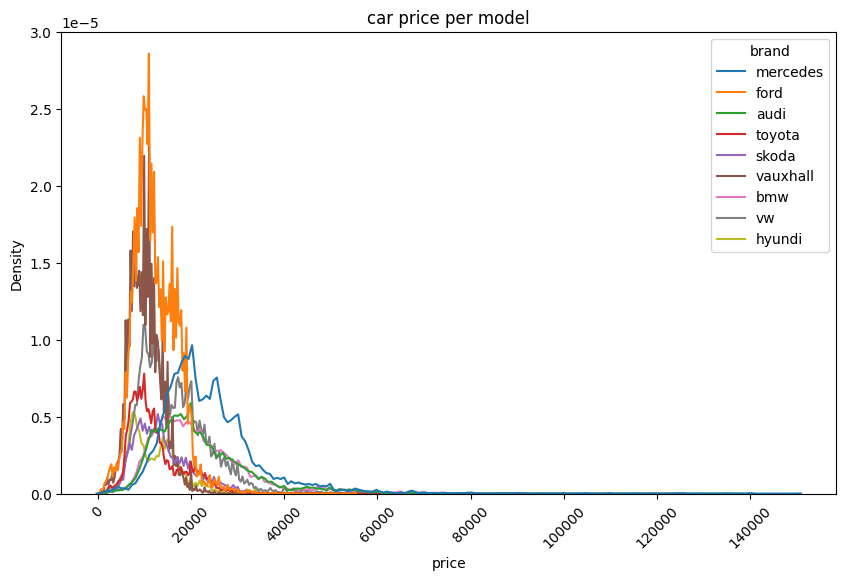

In [29]:
#trand on car brand vs sale price  
plt.figure(figsize=(10,6))
sns.kdeplot(data=car, x = 'price', hue="brand", bw_adjust=.2)
plt.xticks(rotation=45)
plt.title('car price per model')
plt.show()

In [30]:
#Scatter plot showeing the distribution of the numeric column
fig = px.scatter_matrix(car,
    dimensions=["price", "engineSize", "mileage",'year'],
    color="transmission")
fig.show()

In [31]:
# car price range category
fig = px.pie(brands, values='price', names='brand_category', title='car price range')
fig.show()

In [32]:
# Profit per car price vs transmission
fig = px.pie(car, values='price', names='fuelType', title='car price vs fuelType')
fig.show()

In [33]:
# Profit per car price vs transmission
fig = px.pie(car, values='price', names='transmission', title='car price vs transmission')
fig.show()

In [34]:
fig = px.scatter(car, x="price", y="mileage", size="engineSize", color="transmission")
fig.show()

INSIGHT

Price compare with mileage column plus  the engine size and transmission, which we find out that automatic and Semi auto, are the most expensives vehicles yet with the loweest mileage.

In [35]:
fig = px.scatter(car, x="price", y="mileage", color="fuelType")
fig.show()

In [36]:
fig = px.sunburst(car, path=['brand', 'model'], values='price',color='brand', hover_data=['transmission'])
fig.show()

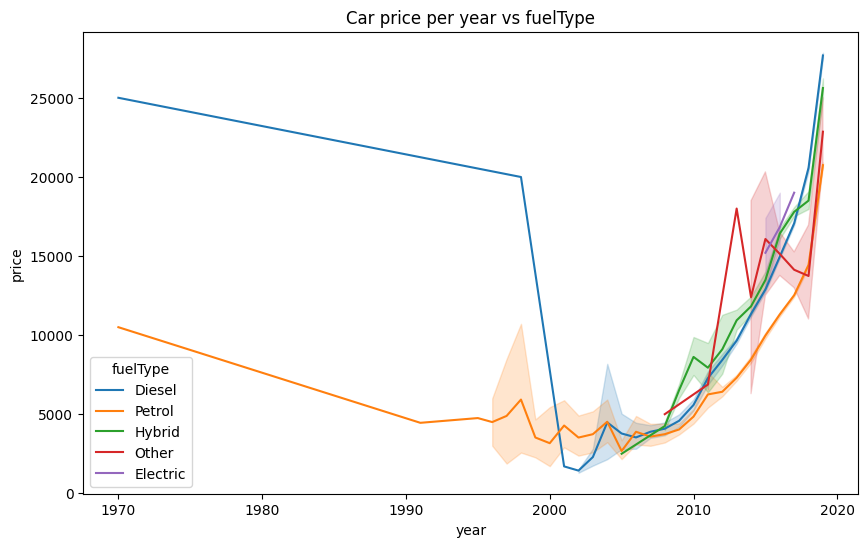

In [37]:
plt.figure(figsize=(10,6))
sns.lineplot(car, x='year', y='price', hue='fuelType')
plt.title('Car price per year vs fuelType')
plt.show()

INSIGHT

* 2001 is the year when car prices were abnormally decreased, but just after 2003, car prices started to regain their position in the market. With this in mind, since 2005, the hybrid fuel type has been rapidly increasing due to the popular demand, but diesel is still on top of the ranks

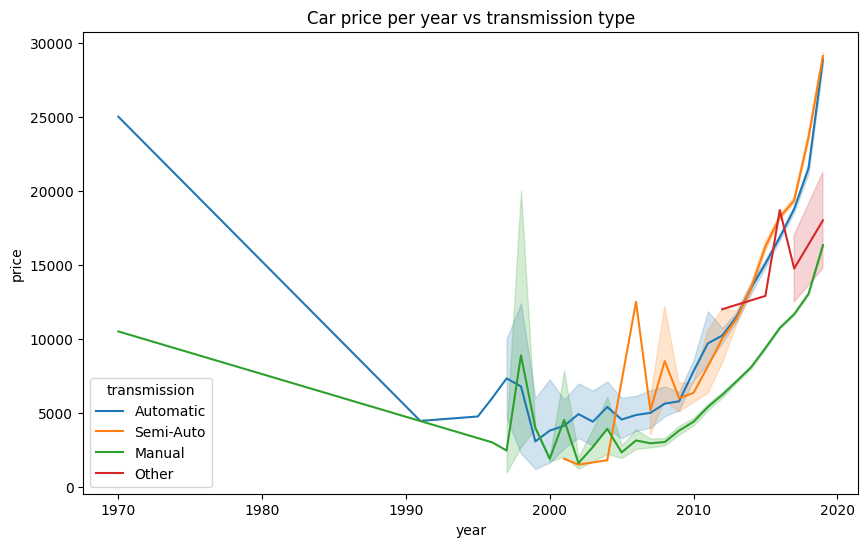

In [38]:
plt.figure(figsize=(10,6))
sns.lineplot(car, x='year', y='price', hue='transmission')
plt.title('Car price per year vs transmission type')
plt.show()

## scatterplot plus regplot 

This 2 fonction which is going to display the correlation or the relationship of the variable show below

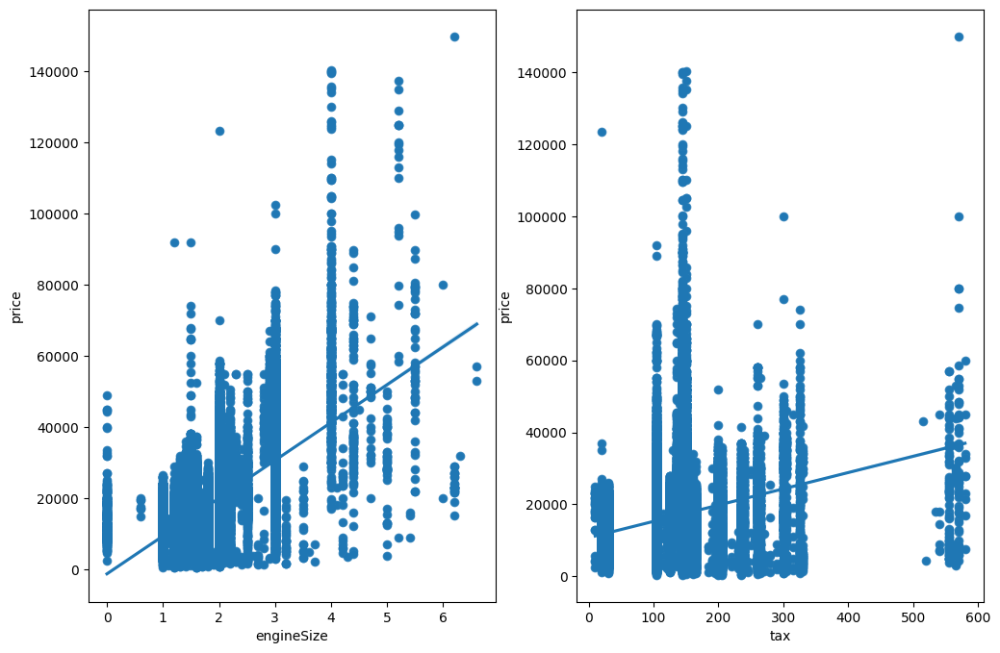

In [39]:
fig, (ax1, ax2) = plt.subplots(figsize = (12,8), ncols=2,sharey=False)
sns.scatterplot( x = car.engineSize, y = car.price,  ax=ax1)
sns.regplot(x=car.engineSize, y=car.price, ax=ax1)
 
sns.scatterplot(x = car.tax,y = car.price, ax=ax2)
sns.regplot(x=car.tax, y=car.price, ax=ax2);


We can see, as per the above result, the price and engeneSize are having a positive correlation but eh price and tax are having negative corretion

<Axes: >

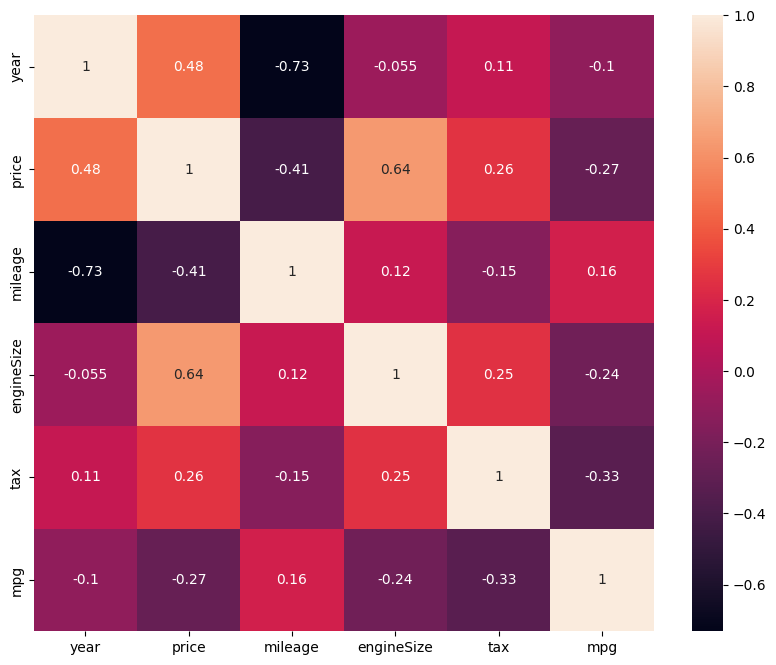

In [40]:
num= car.select_dtypes(include=np.number)

plt.figure(figsize=(10,8))
sns.heatmap(num.corr(), annot= True)

remove the oulier, from 0.01 to 0.99 parcent

In [41]:
outliers = [ 'price', 'mileage', 'engineSize', 'tax', 'mpg']
#remove the oulier, from 0.01 to 0.99 parcent
for c in outliers:
    Q1=car[c].quantile(0.01)
    Q3=car[c].quantile(0.99)
    car=car[car[c]<=Q3]
    car=car[car[c]>=Q1]

Normalize price column

<Axes: xlabel='price', ylabel='Count'>

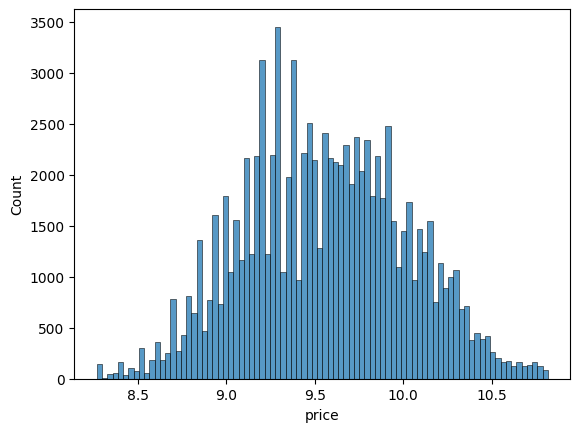

In [42]:
car['price'] = np.log(car['price'])

sns.histplot(data=car, x='price')

## Machine learning Model

In [43]:
car.tail()

,model,year,price,transmission,mileage,fuelType,engineSize,brand,tax,mpg,brand_category
108531,CLA Class,2019,10.146395,Automatic,11442,Diesel,2.1,mercedes,145.0,51.4,Luxury
108532,B Class,2019,9.870138,Automatic,15257,Petrol,1.3,mercedes,145.0,45.6,Mid_Range
108533,C Class,2019,10.322165,Automatic,5000,Diesel,2.0,mercedes,145.0,61.4,Luxury
108537,GLC Class,2019,10.341710,Automatic,11612,Diesel,2.1,mercedes,145.0,41.5,Luxury
108538,CLS Class,2019,10.545078,Automatic,2426,Diesel,2.0,mercedes,145.0,45.6,Luxury


In [44]:
#select features for machine learning
from sklearn.preprocessing import LabelEncoder

# Select the relevant columns from the DataFrame
data = car[['transmission', 'fuelType', 'brand_category']]

# Columns to perform label encoding on
columns_to_encode = ['transmission', 'fuelType', 'brand_category']

# Create a LabelEncoder instance
label_encoder = LabelEncoder()

# Apply label encoding to each column in columns_to_encode
for column in columns_to_encode:
    data[column] = label_encoder.fit_transform(data[column])

# concatinate the data and num file
data_df = pd.concat([data,num],axis=1)

data_df.dropna(inplace=True)


We can split the data into the features ```X``` and target ```y```.

In [45]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score 

X = data_df.drop("price", axis=1)
y = data_df['price']


In [46]:
kf = KFold(shuffle=True, random_state=72018, n_splits=3)

for train_index, test_index in kf.split(X):
    print("Train index:", train_index[:10], len(train_index))
    print("Test index:",test_index[:10], len(test_index))
    print('')


Train index: [ 0  2  4  5  6  8 10 11 12 13] 63273
Test index: [ 1  3  7  9 17 21 22 26 28 30] 31637

Train index: [ 0  1  2  3  4  7  9 10 11 12] 63273
Test index: [ 5  6  8 13 14 15 16 19 20 23] 31637

Train index: [ 1  3  5  6  7  8  9 13 14 15] 63274
Test index: [ 0  2  4 10 11 12 18 29 33 34] 31636



Now, we split our data, using <code>train_test_split</code> function, into the training and testing sets, allocating 30% of the data for testing.

In [47]:
from sklearn.model_selection import train_test_split


In [48]:
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import numpy as np

# Initialize an empty list to store the scores
scores = []

# Create an instance of the LinearRegression model
lr = LinearRegression()

# Define the number of splits for KFold
kf = KFold(n_splits=5, shuffle=True, random_state=72018)

# Loop through the splits provided by the cross-validator (kf)
for train_index, test_index in kf.split(X):
    # Split the data into training and testing sets
    X_train, X_test = X.iloc[train_index, :], X.iloc[test_index, :]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Fit the model on the training data
    lr.fit(X_train, y_train)
        
    # Predict on the test data
    y_pred = lr.predict(X_test)

    # Calculate the R² score for the predictions
    score = r2_score(y_test, y_pred)
    
    # Append the score to the list
    scores.append(score)
    
# Display the scores
scores


[0.7391777514080533,
 0.7423937670626252,
 0.7416916142895396,
 0.7356056678766953,
 0.7338150851604849]

In [49]:
# Assuming lr is your fitted linear regression model and X is your feature DataFrame
coef = lr.coef_  # Get the coefficients from the linear regression model
column = X.columns  # Get the feature names

# Create a DataFrame with feature names and their corresponding coefficients
df_ = pd.DataFrame({'Feature': column, 'Coefficient': coef})

# Reset the index if needed (not necessary here since we are creating a new DataFrame)
df_ = df_.reset_index(drop=True)

# Display the DataFrame
print(df_)

          Feature  Coefficient
0    transmission   552.589135
1        fuelType  -260.851609
2  brand_category  -216.708173
3            year  1607.069334
4         mileage    -0.096024
5      engineSize  9377.258976
6             tax    -5.287225
7             mpg  -112.792725


In [50]:
"""
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42)
print("Number of test samples:", X_test.shape[0])
print("Number of training samples:", X_train.shape[0])
"""


'\nX_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42)\nprint("Number of test samples:", X_test.shape[0])\nprint("Number of training samples:", X_train.shape[0])\n'

### Multiple features

Let's create a <code>LinearRegression</code> object, called `lm`.


In [51]:
lm = LinearRegression()
#Now, let's fit the model with multiple features on our X_train and y_train data.
lm.fit(X_train, y_train)

LinearRegression()

We apply `predict(`) function on the testing data set.

In [52]:
predicted = lm.predict(X_test)

Let's calculate the `r2_score()` on both, training and testing data sets.

In [53]:
print("R^2 on training  data ",lm.score(X_train, y_train))
print("R^2 on testing data ",lm.score(X_test,y_test))

R^2 on training  data  0.7398097561932939
R^2 on testing data  0.7338150851604849


We can plot distributions of the predicted values versus the actual values.

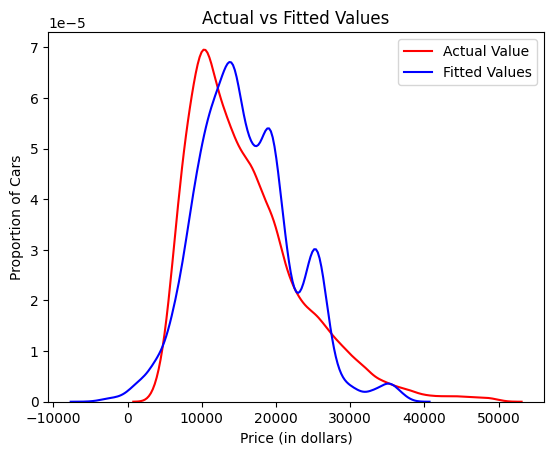

In [54]:
plot_dis(y_test,predicted)

# Pipeline

We can also use the pipeline to run operations on our data. For example we can standardize our data then perform linear regression by applying the method <code>fit</code>.

In [55]:
pipe = Pipeline([('ss',StandardScaler() ),('lr', LinearRegression())])
pipe.fit(X_train,y_train)
pipe

Pipeline(steps=[('ss', StandardScaler()), ('lr', LinearRegression())])

In [56]:
pipe.score(X_train,y_train)

0.7398097561932944

Using the training data only, the R squared is \~ 0.77.\
Now, let's check the R squared on the test set.

In [57]:
pipe.score(X_test,y_test)

0.733815085160485

The R squared is 0.77. This value provides more accurate evaluation of our model since we test our model on the 'unseen' data set. visit this [documentation](https://en.wikipedia.org/wiki/Overfitting?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML240ENSkillsNetwork34171862-2022-01-01) on overfitting.




In [58]:
# Enter your code and run the cell
pipe_1 = Pipeline([('nn',Normalizer() ),('lr', LinearRegression())])
pipe_1.fit(X_train, y_train)

pipe_1.score(X_train,y_train)
pipe_1.score(X_test,y_test)

pred =pipe_1.predict(X_test)

mse = mean_squared_error(y_true=y_test, y_pred=pred)
rmse = np.sqrt(mse)
rmse

5139.537720931229

We can use the test data to select a feature with the best performance. We have a list of features:


In [59]:
features=list(X)
features

['transmission',
 'fuelType',
 'brand_category',
 'year',
 'mileage',
 'engineSize',
 'tax',
 'mpg']

In [60]:
R_2=[]
pipe = Pipeline([('ss',StandardScaler() ),('lr', LinearRegression())])

for feature in features:
    pipe.fit(X_train[[feature]],y_train)
    R_2.append(pipe.score(X_train[[feature]],y_train))
    
    

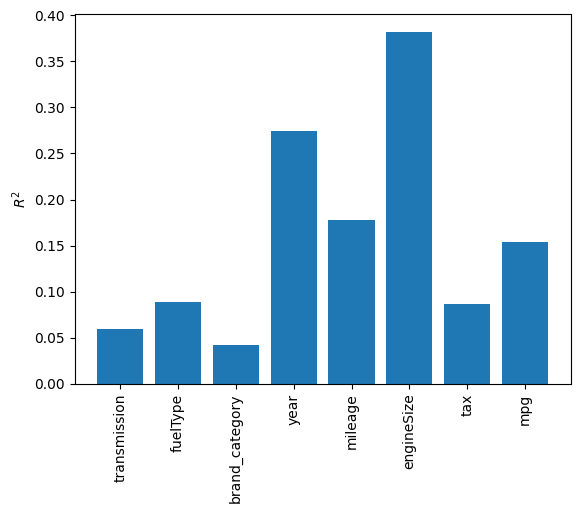

In [61]:
plt.bar(features,R_2)
plt.xticks(rotation=90)
plt.ylabel("$R^2$")
plt.show()

Now, we select the feature that works best, using `argmax()` function.

In [62]:
best=features[np.argmax(R_2)]
best

'engineSize'

So 'engineSize' is the best feature that produce the highest $R^(2)$. We then train the feature that works using all the data

In [63]:
pipe.fit(X[[best]],y)

Pipeline(steps=[('ss', StandardScaler()), ('lr', LinearRegression())])

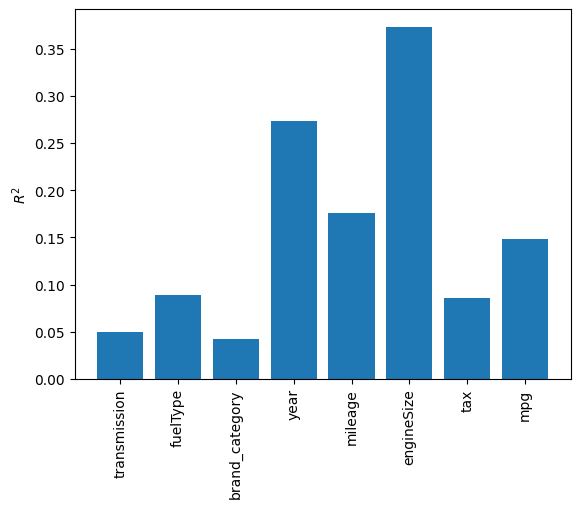

engineSize


In [64]:

R_2=[]

for feature in features:
      lm.fit(X_train[[feature]], y_train)
      R_2.append(lm.score(X_test[[feature]],y_test))
best=features[np.argmax(R_2)]
plt.bar(features,R_2)
plt.xticks(rotation=90)
plt.ylabel("$R^2$")
plt.show()
best=features[np.argmax(R_2)]
print(best)

## Cross Validation Score

Now, let's use *Scikit-Learn's* *K-fold cross-validation* method to see whether we can assess the performance of our model. The *K-fold cross-validation* method splits the training set into the number of folds (n_splits), as now in the Diagram above, if we have K folds, K-1 is used for training and one fold is used for testing. The input parameters are as follows:


<b>estimatorestimator</b>: The object to use to `fit` the data.

<b>X</b>: array-like of shape (n_samples, n_features). The data to fit. Can be for example a list, or an array.

<b>y</b>: array-like of shape (n_samples,) or (n_samples, n_outputs), default=None. The target variable to try to predict in the case of supervised learning.

<b>scoring</b>: A str or a scorer callable object/ function with signature scorer (estimator, X, y) which should return only a single value.  See model evaluation [documentation](https://scikit-learn.org/stable/modules/model_evaluation.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML240ENSkillsNetwork34171862-2022-01-01#scoring-parameter) for more information.


In [65]:
N=len(X)
N

94910

Now, let's create a Linear Regression object.

Then, calculate cross validation scores based on our testing sets.

In [66]:
scores = cross_val_score(lm, X, y, scoring ="r2", cv=3)

We can calculate mean and standard deviation using the following function of the `scores`:

In [67]:
def display_scores(scores, print_=False):
    
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())
    
display_scores(scores)

Scores: [0.73656463 0.54091206 0.71698668]
Mean: 0.664821121760565
Standard deviation: 0.08798074079779247


result: 

* The larger the fold, the better the model performance is, as we are using more samples for training; the variance also decreases.

* Cross Validation Scores are RMSE values for training the data on each of our folds, in our case cv = 3, so we get 3 scores, 1 for each fold.

* in this case will need more feature to get better score 

The **engineSize** is the best feature that produce the highest $R^(2)$



In [68]:
Lasso(alpha=1.0).fit(X, y).coef_

array([ 5.45061735e+02, -2.55492526e+02, -2.16511978e+02,  1.61587493e+03,
       -9.52343265e-02,  9.37795408e+03, -5.35314162e+00, -1.12156981e+02])

### Decision Tree Regressor

In [69]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score


# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create the model
model = DecisionTreeRegressor(random_state=0)

# Fit the model
model.fit(X_train, y_train)

# Make predictions
predictions = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Mean Squared Error: 5963339.7379447
R-squared: 0.8960817610188445


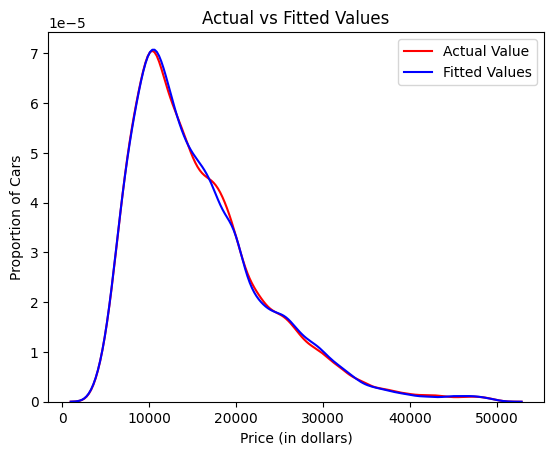

In [70]:
plot_dis(y_test,predictions)

In [71]:
model.feature_importances_

array([0.00906551, 0.00433697, 0.77366486, 0.05027501, 0.04866048,
       0.06029142, 0.01049492, 0.04321082])

Compare the predicted data vs train train

In [72]:
def compare(y_test, predictions) :
  compare = pd.DataFrame()
  compare["Actual"] = y_test
  compare["Predict"] = predictions

  return compare

In [73]:
compare(y_test, predictions)

,Actual,Predict
78803,11950,13599.0
19857,42750,36479.0
99049,25795,25399.0
39457,22450,26980.0
102533,36000,28660.0
...,...,...
23597,9340,8959.0
19381,23000,20000.0
77785,12402,11960.0
87709,5499,8991.0


Build a prediction model test

In [74]:
 X.iloc[11:12]

,transmission,fuelType,brand_category,year,mileage,engineSize,tax,mpg
17,3.0,0.0,1.0,2017,17000,2.1,105.033974,50.76112


In [75]:
# will rondomly select the array to test the our model buld 
input_data = X.iloc[11:12]

#change the input data into numpy array
input_data_asnumpy_array = np.asanyarray(input_data)

#reshape the numpy array are we are insert new value for prediction
input_data_reshaped = input_data_asnumpy_array.reshape(1,-1)

prediction = model.predict(input_data_reshaped)
print('The predicted amount is',prediction)

The predicted amount is [23500.]
